# Import required libraries

In [87]:
import numpy as np
import pandas 
import matplotlib.pyplot as plt
import tensorflow as tf
from pandas.plotting import scatter_matrix

# Loading the dataset

In [4]:
data = pd.read_csv("../data/gender_detection/internal/voice.csv")

# Look at the dataset

In [5]:
data.head(7)

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male
5,0.132786,0.079557,0.119090,0.067958,0.209592,0.141634,1.932562,8.308895,0.963181,0.738307,...,0.132786,0.110132,0.017112,0.253968,0.298222,0.007812,2.726562,2.718750,0.125160,male
6,0.150762,0.074463,0.160106,0.092899,0.205718,0.112819,1.530643,5.987498,0.967573,0.762638,...,0.150762,0.105945,0.026230,0.266667,0.479620,0.007812,5.312500,5.304688,0.123992,male


# A look at the columns

In [6]:
data.columns

Index(['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx', 'label'],
      dtype='object')

# Size of dataset

In [7]:
data.size

66528

# Description of the dataset

In [8]:
data.describe()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,0.165282,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,0.077203,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,0.118016,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,0.186599,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,0.221104,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


# Data Preprocessing

In [9]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
data["label"] = le.fit_transform(data["label"])
le.classes_

array(['female', 'male'], dtype=object)

In [10]:
data[:]=preprocessing.MinMaxScaler().fit_transform(data)
data.head()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:334: DataConversionWarning: Data with input dtype int32, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.096419,0.473409,0.084125,0.060063,0.204956,0.254828,0.367853,0.208279,0.635798,0.564526,...,0.096419,0.157706,0.030501,0.981526,0.000000,0.006452,0.000000,0.000000,0.000000,1.0
1,0.125828,0.505075,0.116900,0.077635,0.215683,0.246961,0.644279,0.483766,0.630964,0.591578,...,0.125828,0.287642,0.031140,0.834600,0.000407,0.006452,0.002144,0.002146,0.056449,1.0
2,0.179222,0.675536,0.102873,0.034284,0.385912,0.457148,0.885255,0.782275,0.442738,0.548382,...,0.179222,0.236945,0.030264,0.954963,0.000060,0.006452,0.000357,0.000358,0.049885,1.0
3,0.528261,0.554611,0.587559,0.389906,0.715802,0.407358,0.031549,0.001613,0.923261,0.856457,...,0.528261,0.183442,0.041287,0.834600,0.065659,0.006452,0.025375,0.025393,0.265043,1.0
4,0.452195,0.627209,0.454272,0.317627,0.707515,0.474474,0.027742,0.001732,0.958736,0.926348,...,0.452195,0.279190,0.036829,0.929285,0.238994,0.006452,0.250536,0.250715,0.223380,1.0


In [59]:
data.corr()['IQR']

meanfreq   -0.627605
sd          0.874660
median     -0.477352
Q25        -0.874189
Q75         0.009636
IQR         1.000000
skew        0.249497
kurt        0.316185
sp.ent      0.640813
sfm         0.663601
mode       -0.403764
centroid   -0.627605
meanfun    -0.534462
minfun     -0.222680
maxfun     -0.069588
meandom    -0.333362
mindom     -0.357037
maxdom     -0.337877
dfrange    -0.331563
modindx     0.041252
label       0.618916
Name: IQR, dtype: float64

In [23]:
high_corr = []
i =0
for e in data.corr()['label'].where((abs(data.corr()['label'])>0.3)):
    if not np.isnan(e):
        #print(e)
#         print(data.corr()['label'].keys()[i])
        high_corr.append(data.corr()['label'].keys()[i])
        #print(i)
    i = i +1

print(high_corr)

['meanfreq', 'sd', 'Q25', 'IQR', 'sp.ent', 'sfm', 'centroid', 'meanfun', 'label']


## A sneap peak at Dataset

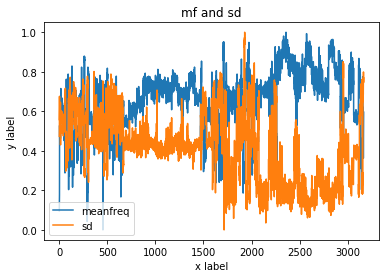

In [24]:
plt.plot(data['meanfreq'])
plt.plot(data['sd'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.title("mf and sd")

plt.legend()

plt.show()

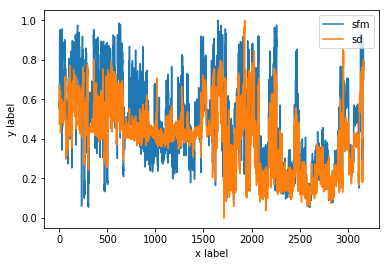

In [28]:
plt.plot(data['sfm'])
plt.plot(data['sd'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

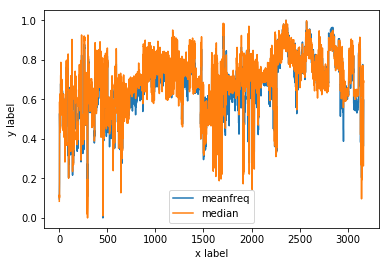

In [29]:
plt.plot(data['meanfreq'])
plt.plot(data['median'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

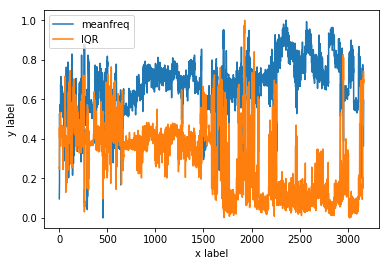

In [30]:
plt.plot(data['meanfreq'])
plt.plot(data['IQR'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

In [ ]:
plt.plot(data['meanfreq'])
plt.plot(data['IQR'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

In [31]:
# meanfreq   -0.337415
# sd          0.479539
# median     -0.283919
# Q25        -0.511455
# Q75         0.066906
# IQR         0.618916
# skew        0.036627
# kurt        0.087195
# sp.ent      0.490552
# sfm         0.357499
# mode       -0.171775
# centroid   -0.337415
# meanfun    -0.833921
# minfun     -0.136692
# maxfun     -0.166461
# meandom    -0.191067
# mindom     -0.194974
# maxdom     -0.195657
# dfrange    -0.192213
# modindx     0.030801
# label       1.000000

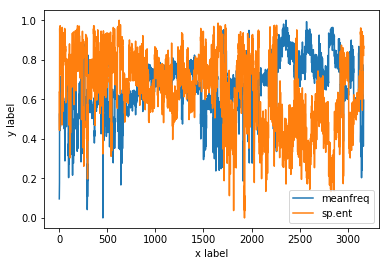

In [34]:
plt.plot(data['meanfreq'])
plt.plot(data['sp.ent'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

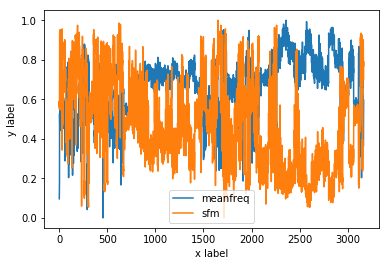

In [36]:
plt.plot(data['meanfreq'])
plt.plot(data['sfm'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

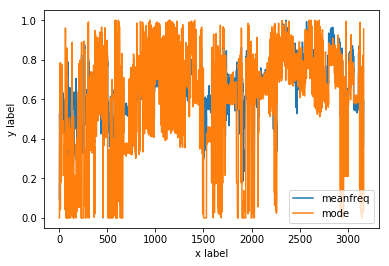

In [37]:
plt.plot(data['meanfreq'])
plt.plot(data['mode'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

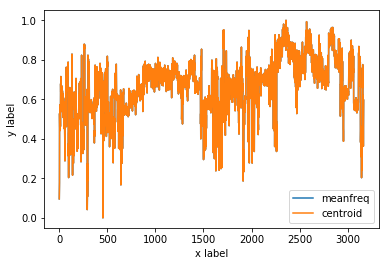

In [38]:
plt.plot(data['meanfreq'])
plt.plot(data['centroid'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

In [39]:
# drop centroid

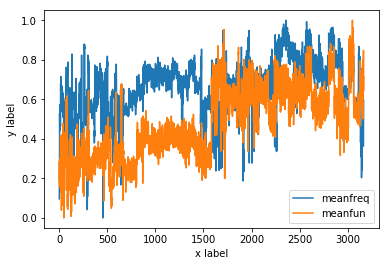

In [40]:
plt.plot(data['meanfreq'])
plt.plot(data['meanfun'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

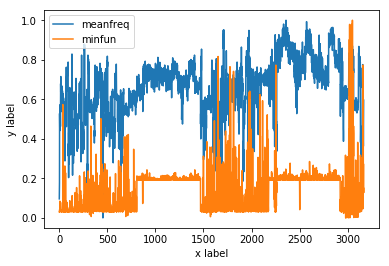

In [41]:
plt.plot(data['meanfreq'])
plt.plot(data['minfun'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

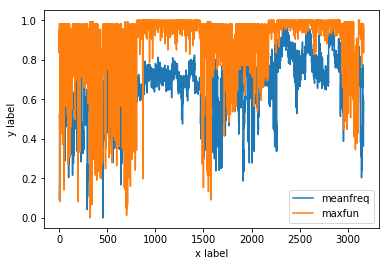

In [42]:
plt.plot(data['meanfreq'])
plt.plot(data['maxfun'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

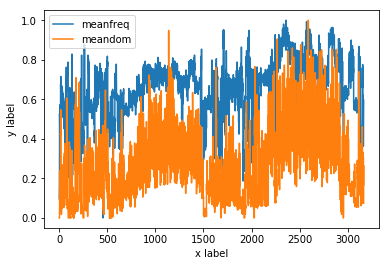

In [43]:
plt.plot(data['meanfreq'])
plt.plot(data['meandom'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

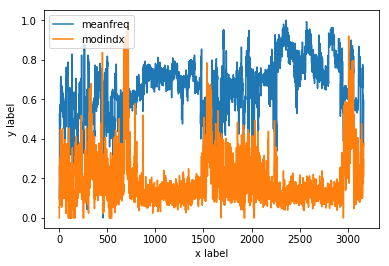

In [48]:
plt.plot(data['meanfreq'])
plt.plot(data['modindx'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

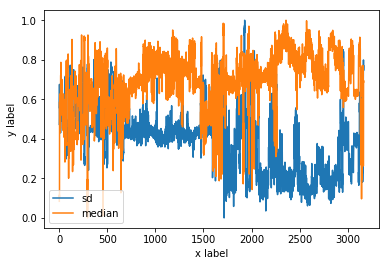

In [49]:
plt.plot(data['sd'])
plt.plot(data['median'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

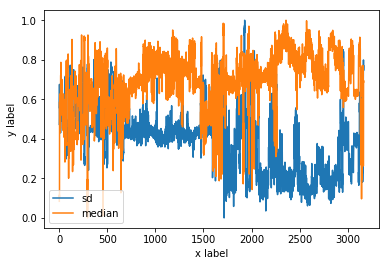

In [50]:
plt.plot(data['sd'])
plt.plot(data['median'])

plt.xlabel('x label')
plt.ylabel('y label')

plt.legend()

plt.show()

<Figure size 1600x640 with 0 Axes>

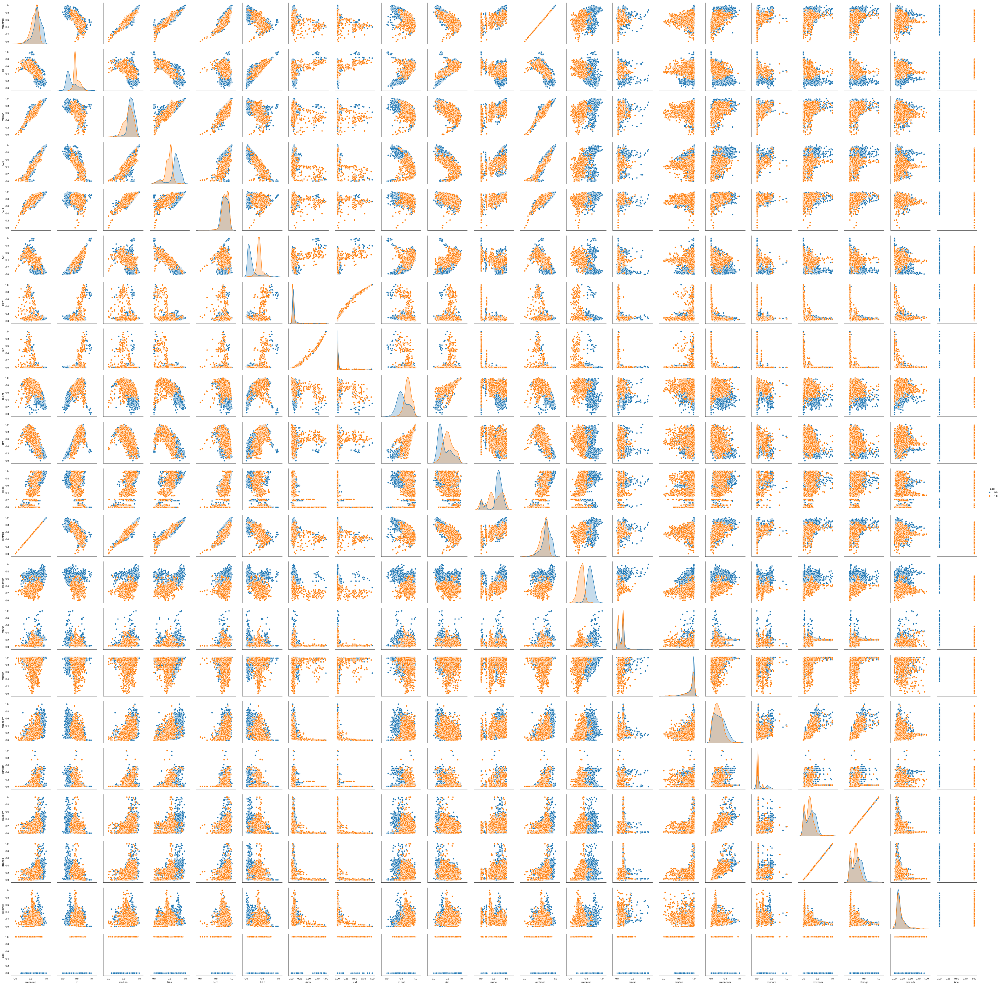

In [100]:
import seaborn as sns
sns.set_style("white")
plt.figure(figsize=(20,8), dpi= 80)
sns.pairplot(data, hue="label", kind="scatter")
plt.show()

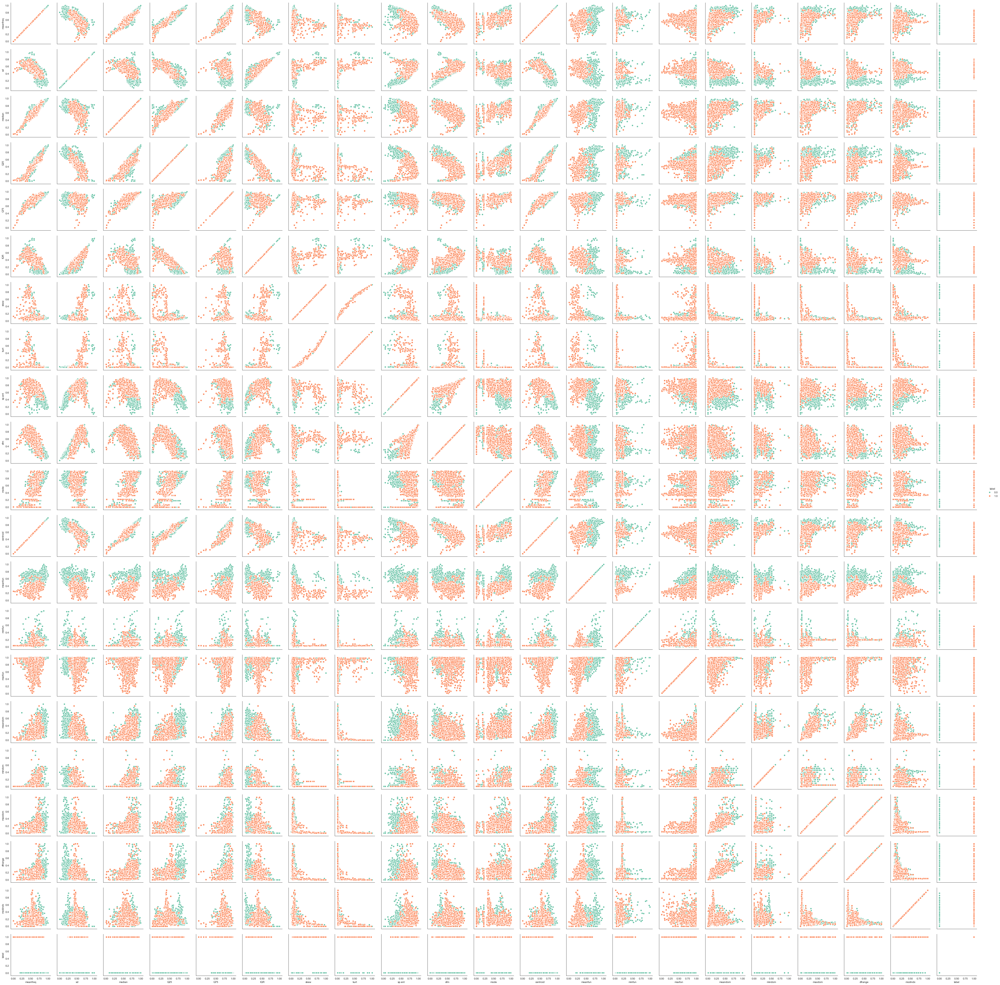

In [102]:
g = sns.PairGrid(data, hue="label", palette="Set2", hue_kws={"marker": ["o", "s", "D"]})
g = g.map(plt.scatter, linewidths=1, edgecolor="w", s=40)
g = g.add_legend()